In [1]:
#Lapsed donors on this dataset are from the promotion nº 2, 17NK (from Forums)
#data['RFA_2R'].value_counts()

In [2]:
#2017-06-01 is the most recent date on ADATE2 -> use this one

# Data Mining Project
Group members: <br>
Bruno Belo <br>
Rui Monteiro <br>
Tomás Santos

## 1. Import and assessing data

In [3]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from math import ceil
from datetime import datetime
import math

In [4]:
# Goes to the previous folder, accesses the data folder, and gets the path to the donors.csv file (this is done bc the  
# file is too large to upload on GitHub)
path = os.path.join('..', 'data', 'donors.csv')

data = pd.read_csv(path, sep = ',')

data.head()

C:\Users\ruifi\anaconda3\envs\DMclasses\lib\site-packages\IPython\core\interactiveshell.py:3145: DtypeWarning: Columns (9,412) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


,Unnamed: 0,ODATEDW,OSOURCE,TCODE,STATE,ZIP,MAILCODE,PVASTATE,DOB,NOEXCH,...,AVGGIFT,CONTROLN,HPHONE_D,RFA_2R,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2
0,0,2009-01-01,GRI,0,IL,61081,,,1957-12-01,0,...,7.741935,95515,0,L,4,E,X,X,X,C
1,1,2014-01-01,BOA,1,CA,91326,,,1972-02-01,0,...,15.666667,148535,0,L,2,G,X,X,X,A
2,2,2010-01-01,AMH,1,NC,27017,,,NaN,0,...,7.481481,15078,1,L,4,E,X,X,X,C
3,3,2007-01-01,BRY,0,CA,95953,,,1948-01-01,0,...,6.812500,172556,1,L,4,E,X,X,X,C
4,4,2006-01-01,,0,FL,33176,,,1940-01-01,0,...,6.864865,7112,1,L,2,F,X,X,X,A


In [5]:
# Get a copy of the original dataset
data_original = data.copy()

In [6]:
# Optional -> to check all the columns or rows
#pd.set_option('display.max_columns', None)
#pd.set_option('display.max_rows', None)

In [7]:
# Dimension of the dataset
data.shape

(95412, 476)

In [8]:
# Data types of the variables and columns
data.dtypes

Unnamed: 0     int64
ODATEDW       object
OSOURCE       object
TCODE          int64
STATE         object
               ...  
RFA_2A        object
MDMAUD_R      object
MDMAUD_F      object
MDMAUD_A      object
GEOCODE2      object
Length: 476, dtype: object

In [9]:
# Summary Statistics of our variables
data.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Unnamed: 0,95412,NaN,NaN,NaN,47705.5,27543.2,0,23852.8,47705.5,71558.2,95411
ODATEDW,95412,54,2015-01-01,15358,NaN,NaN,NaN,NaN,NaN,NaN,NaN
OSOURCE,95412,896,MBC,4539,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TCODE,95412,NaN,NaN,NaN,54.2231,953.844,0,0,1,2,72002
STATE,95412,57,CA,17343,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
RFA_2A,95412,4,F,46964,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MDMAUD_R,95412,5,X,95118,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MDMAUD_F,95412,4,X,95118,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MDMAUD_A,95412,5,X,95118,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
# Info on the donors dataset
data.info(max_cols=476)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 95412 entries, 0 to 95411
Data columns (total 476 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  95412 non-null  int64  
 1   ODATEDW     95412 non-null  object 
 2   OSOURCE     95412 non-null  object 
 3   TCODE       95412 non-null  int64  
 4   STATE       95412 non-null  object 
 5   ZIP         95412 non-null  object 
 6   MAILCODE    95412 non-null  object 
 7   PVASTATE    95412 non-null  object 
 8   DOB         71529 non-null  object 
 9   NOEXCH      95412 non-null  object 
 10  RECINHSE    95412 non-null  object 
 11  RECP3       95412 non-null  object 
 12  RECPGVG     95412 non-null  object 
 13  RECSWEEP    95412 non-null  object 
 14  MDMAUD      95412 non-null  object 
 15  DOMAIN      95412 non-null  object 
 16  HOMEOWNR    95412 non-null  object 
 17  CHILD03     95412 non-null  object 
 18  CHILD07     95412 non-null  object 
 19  CHILD12     95412 non-nu

In [11]:
# Check duplicates
any(data.duplicated())

False

In [12]:
# Count of missing values
data.isna().sum()

Unnamed: 0      0
ODATEDW         0
OSOURCE         0
TCODE           0
STATE           0
             ... 
RFA_2A          0
MDMAUD_R        0
MDMAUD_F        0
MDMAUD_A        0
GEOCODE2      132
Length: 476, dtype: int64

## 2. Data Treatment

In [13]:
# Ver no coherence:
# O LASTDATE é o resumo das campanhas, mas como a ultima data das campanhas está, várias vezes, incoerente com as RDATE, e
# e tendo em conta que estas têm muitos missing values (algumas mais de 70%), decidimos dropar as RDATE. Assumimos, tbm, 
# que há muitos valores que podem ter sido inseridos manualmente, o que leva às incoerências.

In [14]:
#CONTROLN: stays as index of the dataset
data.set_index('CONTROLN', inplace=True)

In [15]:
#Problema pa depois:

#put aside the variables that are already related to a PVA's clustering, and may be used in the end to compare it to our
#solution...:
donors_pva_cluster = data[['MDMAUD', 'DOMAIN', 'GEOCODE', 'PEPSTRFL']].copy()

#MDMAUD: RFA field, already a clustering from the organization

#put this aside because it is clustering (this one is a bit different from the RFA variables)
#donors_pva_cluster.replace({'DOMAIN' : {' ' : np.nan}}, inplace = True)

#GEOCODE is what? Put aside for now - clustering
#donors_pva_cluster.replace({'GEOCODE' : {' ' : np.nan}}, inplace = True)

#probably put aside! bc it's related to RFA
#donors_pva_cluster.replace({'PEPSTRFL' : {'X' : '1', ' ' : '0'}}, inplace = True)

rfa1 = data.loc[:, 'RFA_2':'RFA_24'].copy()
donors_pva_cluster = pd.merge(donors_pva_cluster, rfa1, left_index=True, right_index=True)
#from RFA_2 to RFA_24: these are variables with a clustering solution from PVA; don't use them for now (maybe use them
#in the end to compare with our own clustering solution)

rfa_and_mdmaud = data.loc[:, 'RFA_2R':'MDMAUD_A'].copy()
donors_pva_cluster = pd.merge(donors_pva_cluster, rfa_and_mdmaud, left_index=True, right_index=True)
#RFA_2R, RFA_2F, RFA_2A are related to RFA (put aside for now?)
#MDMAUD_R, MDMAUD_F, MDMAUD_A are related to RFA (put aside for now?)

donors_pva_cluster.head()

,MDMAUD,DOMAIN,GEOCODE,PEPSTRFL,RFA_2,RFA_3,RFA_4,RFA_5,RFA_6,RFA_7,...,RFA_21,RFA_22,RFA_23,RFA_24,RFA_2R,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A
CONTROLN,,,,,,,,,,,,,,,,,,,,,
95515,XXXX,T2,,X,L4E,S4E,S4E,S4E,S4E,S4E,...,S4E,S4E,S4E,S4E,L,4,E,X,X,X
148535,XXXX,S1,02,,L2G,A2G,A2G,A2G,A2G,A1E,...,N1E,N1E,,F1E,L,2,G,X,X,X
15078,XXXX,R2,,X,L4E,S4E,S4E,S4E,S4E,S4F,...,,S4D,S4D,S3D,L,4,E,X,X,X
172556,XXXX,R2,,X,L4E,S4E,S4E,S4E,S4E,S4E,...,A1D,A1D,,,L,4,E,X,X,X
7112,XXXX,S2,,,L2F,A2F,A2F,A2F,A1D,I2D,...,A3D,I4E,A3D,A3D,L,2,F,X,X,X


In [16]:
#drop these:
data.drop(columns = ['Unnamed: 0',
                     'NOEXCH',
                     'WEALTH1',
                     'DATASRCE',
                     'LIFESRC'], inplace = True)

#Unnamed: 0: it has indexes from 0 to 95412, it's redundant

#NOEXCH: this var. has inconsistencies with the metadata available, as there's no reference to '0', '1', 0 or 1 values
#BELO - COHERENCE
#drop this! (incoherent, bc the variable has many incoherences with the metadata -> explicar melhor no relatório)
#data['NOEXCH'].value_counts()

#WEALTH1 has similar values to WEALTH2 but the metadata does not specify what is the variable, so we decided to keep
#the WEALTH2, which is well described
#data = data.astype({"WEALTH1": object})
#data['WEALTH1'].unique()

#data['DATASRCE'].unique()
#data.replace({'DATASRCE' : {' ' : np.nan}}, inplace = True)
#says which was the source of the data in this section of variables; it has 21280 ' ' (blanks)
#DROP! bc the variable is not very useful for interpreting the clusters (we are not sure about what are the values 
#representing... companies? we could not find on the internet)

#LIFESRC: same as DATASRCE...
#data['LIFESRC'].value_counts()
#data.replace({'LIFESRC' : {' ' : np.nan}}, inplace = True)
#says which was the source of the data in this section of variables; it has 54032 ' ' (blanks)
#DROP! bc the variable is not very useful for interpreting the clusters (we are not sure about what are the values 
#representing... companies? we could not find on the internet)

#We decided to drop all ADATE_x; RDATE_x and RAMNT_x bc they are incoherent with the summary variables.
#The code showing why we think these are incoherent is on the Coherence Check phase.

# Drop all 'ADATE_x' - We do not drop ADATE_2 to use it for calculating who are and who aren't the lapsed donors on the 
# dataset
data = data.drop(columns = data.loc[:,'ADATE_3':'ADATE_24'].columns)

# Drop all 'RDATE_x' and all 'RAMNT_x'
data = data.drop(columns = data.loc[:,'RDATE_3':'RAMNT_24'].columns)

In [17]:
#drop variables on the extra dataframe that has the clustering from PVA (donors_pva_cluster)
data.drop(columns = donors_pva_cluster.columns, inplace = True)

In [18]:
#note -> 'NUMCHLD' : int, altough it cannot be converted due to NaNs (float)!
data = data.astype({'TCODE': object, 
                    'INCOME': object,
                    'WEALTH2': object,
                    'MSA': object,
                    'ADI': object,
                    'DMA': object,
                    'HPHONE_D': object})

#INCOME: from the Forums: 7 corresponds to the highest income group and 0 to the lowest one

#MSA has values 0, which is not a MSA code. After researching what does this code represent in the US census, we assume 
#those 0s are for the doners that do not live in a metropolitan statistical area (MSA), a region with at least one 
#urbanized area and a minimum population of 50 000 (Investopedia); so those people may live in towns or rural areas.

#ADI has values 0, which is not an ADI code. After researching what does this code represents, we assume 
#those 0s are for the doners that do not live in a radio or television market region in which that specific population 
#receives the same programming (https://www.insightsassociation.org/issues-policies/glossary/area-dominant-influence-adi);
#this is related to marketing, and those people may live in regions that are not assigned to a code (but this is not a 
#missing value!).

#DMA has values 0, which is not a DMA code. After researching what does this code represents, we assume 
#those 0s are for the doners that do not live in a geographic area in the United States in which local television viewing 
#is measured by Nielsen (https://www.nielsen.com/us/en/intl-campaigns/dma-maps/#:~:text=DMA%20(Designated%20Market%20Area)%20regions,geographic%20areas%20within%20their%20business.)
#again, this code is related to marketing, and those people may live in regions that are not assigned to a code (but this 
#is not a missing value!).

#HPHONE_D is binary (0 or 1)

In [19]:
#dates as string, now as datetimes
#note -> errors='coerce' as in the vast majority of records (if not always) the errors on the to_datetime function are
#rased because the string in the column is empty, thus there isn't a date there; this leads to an error, and with this
#argument definition, the invalid parsing will be set as NaT (Not a Time), which is what we intend (missing values stay
#missing)
data['ODATEDW'] = pd.to_datetime(data['ODATEDW'])
data['DOB'] = pd.to_datetime(data['DOB'], errors='coerce')
#data.loc[:, 'ADATE_2':'ADATE_24'] = data.loc[:, 'ADATE_2':'ADATE_24'].apply(pd.to_datetime, errors='coerce') #from ADATE_2 until ADATE_24
data['MAXADATE'] = pd.to_datetime(data['MAXADATE'])
#data.loc[:, 'RDATE_3':'RDATE_24'] = data.loc[:, 'RDATE_3':'RDATE_24'].apply(pd.to_datetime, errors='coerce') #from RDATE_3 until RDATE_24
data['MINRDATE'] = pd.to_datetime(data['MINRDATE'])
data['MAXRDATE'] = pd.to_datetime(data['MAXRDATE'])
data['LASTDATE'] = pd.to_datetime(data['LASTDATE'])
data['FISTDATE'] = pd.to_datetime(data['FISTDATE'], errors='coerce')
data['NEXTDATE'] = pd.to_datetime(data['NEXTDATE'], errors='coerce')

In [20]:
#to remove the hyphen from the end of the ZIP codes (US zip codes are not supposed to have hyphens, but some do!)
data['ZIP'] = data['ZIP'].map(lambda x: x.replace('-', ''))

#now, the replace: on some vars. swap a blank space for a NaN, on binaries swap the letters for '0' and '1', etc
data.replace({'OSOURCE' : {' ' : np.nan},
                'MAILCODE' : {' ' : '0', 'B' : '1'},
                'PVASTATE' : {' ' : 'N'}, #N = state is not served by any organization
                'RECINHSE' : {' ' : '0', 'X' : '1'},
                'RECP3' : {' ' : '0', 'X' : '1'},
                'RECPGVG': {' ' : '0', 'X' : '1'},
                'RECSWEEP': {' ' : '0', 'X' : '1'},
                'HOMEOWNR' : {' ' : '0', 'H' : '1', 'U' : '0'}, #we assume the blank space on this variable says that it is unknown wether the donor has or not a home (so, we joined it with the 0-Unkwown)
                'CHILD03' : {' ' : 'N'}, #the ' ' (blank) will be replaced by 'N' (N = None), as we assume the blank space in this variable means the donor has no 
                'CHILD07' : {' ' : 'N'}, #children in that specific range of ages
                'CHILD12': {' ' : 'N'},  #note: more than 90 000 records have None, on each of these 4 variables
                'CHILD18': {' ' : 'N'},
                'NUMCHLD': {np.nan : 0}, #assuming NaN is zero, bc there is no zero on this variable!?
                'GENDER' : {' ' : 'U', 'A' : 'U', 'C' : 'U'}, #Incoherence (Belo!) -> nem que se fale só no relatório!
                                                             #values 'A' (2 of them) & 'C' (2) are not described on the metadata, most probably those are errors
                                                             #we assume the blank spaces, As and Cs can be assumed to be Unkwown
                'SOLP3' : {' ' : 'Default'},
                'SOLIH' : {' ' : 'Default'}, #feature engineering: create a binary with -> 0 (can't be mailed), 1 (can be mailed)
                'MAJOR' : {' ' : '0', 'X' : '1'},
                'GEOCODE2' : {' ' : np.nan}}, inplace = True)

#assuming Y = Yes and N = No, on all these vars
data.loc[:, 'COLLECT1':'PLATES'] = data.loc[:, 'COLLECT1':'PLATES'].replace({'Y' : '1', ' ' : '0'}) #from COLLECT1 to PLATES

In [21]:
#after the previous cell, we can put NUMCHLD as int:
data = data.astype({'NUMCHLD': int})

data['NUMCHLD'].unique()

array([0, 1, 2, 3, 4, 5, 6, 7])

In [22]:
#PROBLEM on HHP1 and HHP2: "Median Person Per Household" and "Average Person Per Household" but the values are bery high
#if we interpret this as the median/average number of people living in a household of the neighborhood, then it should
#have values between 1, 2 or 3. Not 100-700. (Incoherence - Belo?)



#perguntar ao professor!!
#decisão final: (nota: ainda há alguns valores iguais a 0)
data['HHP1'] = data['HHP1'] / 100
data['HHP2'] = data['HHP2'] / 100

In [23]:
#RHP1 to RHP4 are kinda weird (Housing Unit??)



#perguntar ao professor: média/mediana das pessoas ser tão alto (50?); ou a descrição da variável não está correta?
#decisão final: we assume this values were multiplied by 10 to avoid storing floats (floats make up more space on data
#files), so we divided this columns by 10, for the values to make more "sense"
data['RHP1'] = data['RHP1'] / 10
data['RHP2'] = data['RHP2'] / 10
data['RHP3'] = data['RHP3'] / 10
data['RHP4'] = data['RHP4'] / 10

In [24]:
#EC1: "Median Years of School Completed by Adults 25+" has minimum 89 and maximum 170... are the values wrong?

#HC1: "Percent Median Length of Residence" is percent and median at the same time? And has values of 0 length! Is it the 
#median time someone has been living in their current home, in years? Very ambiguous:
#HC2: this one has a less ambiguous description but it still says "Percent Median" so is it a percentage or a median? 
#it is confusing


#perguntar ao professor: EC1 (mediana de 170 anos a estudar?):
#decisão final: divided by 10, because 8.9 (min) and 17.0 (max) are values that make more sense
#we assume this values were multiplied by 10 to avoid storing floats (floats make up more space on data
#files), so we divided this columns by 10, for the values to make more "sense"
data['EC1'] = data['EC1'] / 10
#HC1 e HC2 -> we assume this is a median, the "percent" is probably a typo on the metadata descriptions

After the Data Treatment:

In [25]:
data.head()

,ODATEDW,OSOURCE,TCODE,STATE,ZIP,MAILCODE,PVASTATE,DOB,RECINHSE,RECP3,...,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,FISTDATE,NEXTDATE,TIMELAG,AVGGIFT,HPHONE_D,GEOCODE2
CONTROLN,,,,,,,,,,,,,,,,,,,,,
95515,2009-01-01,GRI,0,IL,61081,0,N,1957-12-01,0,0,...,12.0,2014-02-01,10.0,2015-12-01,2009-11-01,2010-03-01,4.0,7.741935,0,C
148535,2014-01-01,BOA,1,CA,91326,0,N,1972-02-01,0,0,...,25.0,2015-12-01,25.0,2015-12-01,2013-10-01,2015-04-01,18.0,15.666667,0,A
15078,2010-01-01,AMH,1,NC,27017,0,N,NaT,0,0,...,16.0,2012-07-01,5.0,2015-12-01,2010-01-01,2011-01-01,12.0,7.481481,1,C
172556,2007-01-01,BRY,0,CA,95953,0,N,1948-01-01,0,0,...,11.0,2014-11-01,10.0,2015-12-01,2007-02-01,2007-11-01,9.0,6.812500,1,C
7112,2006-01-01,NaN,0,FL,33176,0,N,1940-01-01,1,1,...,15.0,2016-01-01,15.0,2016-01-01,1999-03-01,2000-05-01,14.0,6.864865,1,A


In [26]:
data.info(max_cols=371)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 95412 entries, 95515 to 185114
Data columns (total 371 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   ODATEDW   95412 non-null  datetime64[ns]
 1   OSOURCE   94484 non-null  object        
 2   TCODE     95412 non-null  object        
 3   STATE     95412 non-null  object        
 4   ZIP       95412 non-null  object        
 5   MAILCODE  95412 non-null  object        
 6   PVASTATE  95412 non-null  object        
 7   DOB       71529 non-null  datetime64[ns]
 8   RECINHSE  95412 non-null  object        
 9   RECP3     95412 non-null  object        
 10  RECPGVG   95412 non-null  object        
 11  RECSWEEP  95412 non-null  object        
 12  HOMEOWNR  95412 non-null  object        
 13  CHILD03   95412 non-null  object        
 14  CHILD07   95412 non-null  object        
 15  CHILD12   95412 non-null  object        
 16  CHILD18   95412 non-null  object        
 17  NUMCHL

In [27]:
#'HIT' is good to go

In [28]:
#from MBCRAFT to PUBOPP, it all looks good; but it has many missing values!

In [29]:
#from MALEMILI to FEDGOV there are no MVs and everything is fine (check for incoherences: percentages below 0 or 
#above 100?)

In [30]:
#from POP901 until the end of this set of variables, we assume 0s in the first three (Number of Persons, Families and 
#Households) represent people that live in rural areas and small towns, with no one living near them (in the neighborhood)

#gets resolved when we do data = data[data['AGE902'] != 0] (Coherence checks!)

In [31]:
#from POP901 until ETH16, everything looks fine

In [32]:
#PROBLEM on HV1 & HV2: "Median Home Value in hundreds" has values of 0, and then, the second lowest, 75 (which means 7500) 
#the values of 0 are 318 records - same on HV2



#perguntar ao professor: nestas variáveis, assumimos que os 0s são missings, incoerências, ou representam casas alugadas.
#decisão final:
#assumption -> there were homes with very low market values, so when the values where divided by 100 to get the value for 
#the column, it was so close to 0 that the int was 0

In [33]:
#HV3 and HV4, related to rents, also have values 0 but that can mean the people are not paying any rent (maybe they bought
#the house already, or maybe they live with family members and are not paying, etc)

In [34]:
#IC1-IC5: values 0 -> don't declare anything to the state?

In [35]:
#data['TPE10'] has values of 0: people that work at home or live very near to the company/office/...

In [36]:
#from RAMNT_3 until RAMNT_24 -> explicado na parte do Tomás

## 3. Creation of new variables (before Feature Engineering)

We need it for the outlier removal and for the MVs (dates in days or years), bc it is more straightforward than working with datetimes (also for the visualizations).

The date used for calculating these and the lapsed donors was 2017-06-01, the most recent date on the ADATE_2, from the NK17 promotion (most recent promotion).

In [37]:
data['ODATEDW_days'] = (datetime(2017, 6, 1) - data['ODATEDW']).dt.days

#AGE needs to be int after being imputed
data['AGE'] = ((datetime(2017, 6, 1) - data['DOB']).dt.days / 365).map(lambda x: math.floor(x) if math.isnan(x) == False else x)

#from ADATE_3 until ADATE_24 -> droped

data['MAXADATE_days'] = (datetime(2017, 6, 1) - data['MAXADATE']).dt.days

#from RDATE_3 until RDATE_24 -> droped

data['MINRDATE_days'] = (datetime(2017, 6, 1) - data['MINRDATE']).dt.days

data['MAXRDATE_days'] = (datetime(2017, 6, 1) - data['MAXRDATE']).dt.days

data['LASTDATE_days'] = (datetime(2017, 6, 1) - data['LASTDATE']).dt.days

data['FISTDATE_days'] = (datetime(2017, 6, 1) - data['FISTDATE']).dt.days

data['NEXTDATE_days'] = (datetime(2017, 6, 1) - data['NEXTDATE']).dt.days

#NOTE: some of these int variables have type float due to NaNs, change later (after imputing MVs)

In [38]:
# Drop the datetimes, and keep the variables created previously!
data = data.drop(columns = data.loc[:, np.array(data.dtypes == "datetime64[ns]")].columns)

## 4. Data Visualization

In [39]:
# Define metric and non metric
non_metric_vars = data.loc[:, np.array(data.dtypes=="object")].copy()
metric_vars = data.loc[:, ~data.columns.isin(non_metric_vars)].copy()

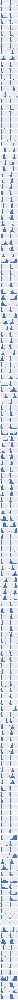

In [48]:
# Metric Variables Histograms 
sns.set()

# Create individual axes 
fig, axes = plt.subplots(ceil(len(metric_vars.columns)/2), 2, figsize=(15, 900))
#plt.subplots_adjust(hspace = 0.18)

# Plot data
for ax, feat in zip(axes.flatten(), metric_vars.columns):
    ax.hist(metric_vars[feat])
    ax.set_title(feat, y = -0.16)
    
# Title
plt.suptitle("Metric variables' histograms", fontsize=25)
  
plt.show()

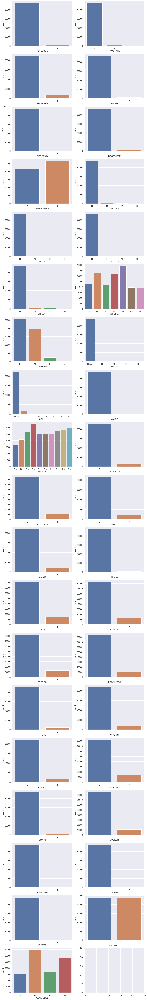

In [54]:
# Non Metric Variables' barplots
sns.set()

non_metric_vars_plot = non_metric_vars.drop(columns=['OSOURCE', 'TCODE', 'STATE', 'ZIP', 'MSA', 'ADI', 'DMA'])

# Prepare figure. Create individual axes where each histogram will be placed.
# OSOURCE, TCODE, STATE, ZIP, MSA, ADI and DMA have too many classes, it is not possible to visualizate it!
fig, axes = plt.subplots(ceil(len(non_metric_vars_plot.columns)/2), 2, figsize=(13, 100))
plt.subplots_adjust(hspace = 0.18)

# Plot data
for ax, feat in zip(axes.flatten(), non_metric_vars_plot.columns):
    sns.countplot(x=non_metric_vars[feat], ax=ax)
    
# Title
plt.suptitle("Non-metric variables' barplots", fontsize=25)

plt.show()

KeyError: 'variable'

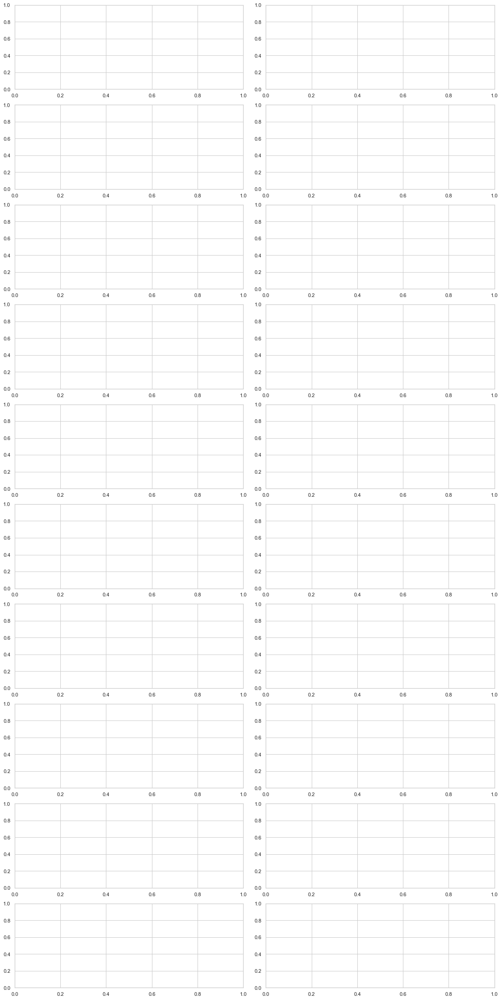

In [55]:
#NÃO FUNCIONA!

sns.set(style="whitegrid")

plot_features = metric_vars.columns

#Prepare figure layout
#fig, axes = plt.subplots(ceil(len(metric_vars.columns)/2), 2, figsize=(15, 900), constrained_layout=True)
fig, axes = plt.subplots(10, 2, figsize=(15, 30),  constrained_layout=True)
#fig, axes = plt.subplots(1, len(plot_features), figsize=(15,8), constrained_layout=True)
 
# Draw the boxplots
for i in zip(axes, plot_features):
    sns.boxplot(x="variable", y="value", data=metric_vars.loc[metric_vars["variable"]==i[1]], ax=i[0])
    i[0].set_xlabel("")
    i[0].set_ylabel("")

# Finalize the plot
plt.suptitle("Metric variables' box plots", fontsize=25)
sns.despine(bottom=True)

plt.show()

In [57]:
# # Metric Variables Correlation Matrix - DEMORA DEMASIADO TEMPO!?
# sns.set(style="white")

# # Compute the correlation matrix
# corr = metric_vars.corr() #Getting correlation of numerical variables

# # Generate a mask for the upper triangle
# mask = np.zeros_like(corr, dtype=np.bool) #Return an array of zeros (Falses) with the same shape and type as a given array
# mask[np.triu_indices_from(mask)] = True #The upper-triangle array is now composed by True values

# # Set up the matplotlib figure
# fig, ax = plt.subplots(figsize=(12, 8))

# # Generate a custom diverging colormap
# cmap = sns.diverging_palette(220, 10, as_cmap=True) #Make a diverging palette between two HUSL colors. Return a matplotlib colormap object.

# # Draw the heatmap with the mask and correct aspect ratio
# sns.heatmap(corr, mask=mask, cmap=cmap, center=0, square=True, linewidths=.5, ax=ax)

# # Layout
# plt.subplots_adjust(top=0.95)
# plt.suptitle("Correlation matrix", fontsize=25)
# plt.yticks(rotation=0)

# # Fixing the bug of partially cut-off bottom and top cells
# b, t = plt.ylim() # discover the values for bottom and top
# b += 0.5 # Add 0.5 to the bottom
# t -= 0.5 # Subtract 0.5 from the top
# plt.ylim(b, t) # update the ylim(bottom, top) values
# plt.show()

In [58]:
# Metric Variables Correlation Matrix
def color_red_or_green(val):
    if val < -0.7:
        color = 'background-color: red'
    elif val > 0.7:
        color = 'background-color: green'
    else:
        color = ''
    return color

# Checking correlations 
correlations = metric_vars.corr()
correlations.style.applymap(color_red_or_green)

## 5. Coherence Checking

In [40]:
import datetime

###### STATE has more than 50 states

In [41]:
#it has more than 50 states bc it includes US territories like the Virgin Islands, Northern Mariana Islands, Guam, etc
data_original['STATE'].nunique()

57

###### Are there any donors more recent than the actual date?

In [42]:
data_original['ODATEDW'] = pd.to_datetime(data_original['ODATEDW'])
data_original['DOB'] = pd.to_datetime(data_original['DOB'], errors='coerce')
data_original['ADATE_2'] = pd.to_datetime(data_original['ADATE_2'])
#data.loc[:, 'ADATE_2':'ADATE_24'] = data.loc[:, 'ADATE_2':'ADATE_24'].apply(pd.to_datetime, errors='coerce') #from ADATE_2 until ADATE_24
data_original['MAXADATE'] = pd.to_datetime(data_original['MAXADATE'])
#data.loc[:, 'RDATE_3':'RDATE_24'] = data.loc[:, 'RDATE_3':'RDATE_24'].apply(pd.to_datetime, errors='coerce') #from RDATE_3 until RDATE_24
data_original['MINRDATE'] = pd.to_datetime(data_original['MINRDATE'])
data_original['MAXRDATE'] = pd.to_datetime(data_original['MAXRDATE'])
data_original['LASTDATE'] = pd.to_datetime(data_original['LASTDATE'])
data_original['FISTDATE'] = pd.to_datetime(data_original['FISTDATE'], errors='coerce')
data_original['NEXTDATE'] = pd.to_datetime(data_original['NEXTDATE'], errors='coerce')

In [43]:
#no donors after today's date
(data_original['ODATEDW'] > datetime.datetime(2020, 1, 1)).sum()

0

###### NOEXCH incoherent with the metadata

In [44]:
data_original['NOEXCH'].value_counts()
#drop this! (incoherent, bc the variable is not very relevant and it 
#is not consistent with the metadata's variables explanation -> explicar melhor no relatório)

0    61203
0    33882
1      195
1       90
X       35
         7
Name: NOEXCH, dtype: int64

###### GENDER incoherent with the metadata

In [45]:
data_original['GENDER'].value_counts() 
#A and C are incoherent, we will assume as U: Unknown

F    51277
M    39094
      2957
U     1715
J      365
C        2
A        2
Name: GENDER, dtype: int64

###### Percentages below 0 or above 100?

In [46]:
print('< 0: \n', (data_original.loc[:, 'MALEMILI':'STATEGOV'] < 0).sum())
print('> 100: \n', (data_original.loc[:, 'MALEMILI':'STATEGOV'] > 100).sum())

#no incoherence

< 0: 
 MALEMILI    0
MALEVET     0
VIETVETS    0
WWIIVETS    0
LOCALGOV    0
STATEGOV    0
dtype: int64
> 100: 
 MALEMILI    0
MALEVET     0
VIETVETS    0
WWIIVETS    0
LOCALGOV    0
STATEGOV    0
dtype: int64


In [47]:
pd.set_option('display.max_rows', 500)
(data_original.loc[:, 'POP901':'AC2']).min()
#(data_original.iloc[:, 75:358]).max()

# percentagens sem incoerencias (tudo entre 0-100), nao sei se precisamos incluir

POP901     0.0
POP902     0.0
POP903     0.0
POP90C1    0.0
POP90C2    0.0
POP90C3    0.0
POP90C4    0.0
POP90C5    0.0
ETH1       0.0
ETH2       0.0
ETH3       0.0
ETH4       0.0
ETH5       0.0
ETH6       0.0
ETH7       0.0
ETH8       0.0
ETH9       0.0
ETH10      0.0
ETH11      0.0
ETH12      0.0
ETH13      0.0
ETH14      0.0
ETH15      0.0
ETH16      0.0
AGE901     0.0
AGE902     0.0
AGE903     0.0
AGE904     0.0
AGE905     0.0
AGE906     0.0
AGE907     0.0
CHIL1      0.0
CHIL2      0.0
CHIL3      0.0
AGEC1      0.0
AGEC2      0.0
AGEC3      0.0
AGEC4      0.0
AGEC5      0.0
AGEC6      0.0
AGEC7      0.0
CHILC1     0.0
CHILC2     0.0
CHILC3     0.0
CHILC4     0.0
CHILC5     0.0
HHAGE1     0.0
HHAGE2     0.0
HHAGE3     0.0
HHN1       0.0
HHN2       0.0
HHN3       0.0
HHN4       0.0
HHN5       0.0
HHN6       0.0
MARR1      0.0
MARR2      0.0
MARR3      0.0
MARR4      0.0
HHP1       0.0
HHP2       0.0
DW1        0.0
DW2        0.0
DW3        0.0
DW4        0.0
DW5        0.0
DW6       

###### Strange values on AGE902

In [48]:
#PROBLEM on AGE902: "Median Age of Adults 18 or Older" but it had a value that was 0... actually, after analyzing the 
#subset of donors that had AGE902 equal to 0, we found out that the vast majority of them had also 0 in basically all
#socio-demographic variables. This leads tu belive the missing values on this columns may be represented by a 0 other than
#a Numpy NaN. Anyways, these records have incoherences, and for this reason, they should be removed (799 records!).

#They have donations... but they should be removed anyways.
#dps disto, o MSA, ADI e DMA deixam de ter missings!

#after removing this records, other incoherences in other variables were also removed
data = data[data['AGE902'] != 0]

#also on data_original:
data_original = data_original[data_original['AGE902'] != 0]

#we decided to remove it during the coherence checking because it was affecting more data 
#where you would only find incoherence in this specific donors

###### Strange values on HHP1 and HHP2

In [49]:
print(data_original[['HHP1', 'HHP2']].min(),'\n', data_original[['HHP1', 'HHP2']].max())
#HHP1/2 == 0 doenst make sense
#HHP1/2 == 650/700 how is that possible?? We assume the same as in EC1 so it makes sense to divide each by 100
#(the values zero can not be all true once it may rounded the values down)

HHP1    0
HHP2    0
dtype: int64 
 HHP1    650
HHP2    700
dtype: int64


###### Strange values on HV1 to HV4

In [50]:
data_original[['HV1', 'HV2', 'HV3', 'HV4']].min()#,'\n', data_original[['HV1', 'HV2', 'HV3', 'HV4']].max())
#HV1/2 - Median and Avg of Home Value == 0 ???
#HV3/4 Median and Avg of contract rent == 0 ???

#PROBLEM on HV1: "Median Home Value in hundreds" has values of 0, and then, the second lowest, 75 (which means 7500)... 
#the values of 0 are incoherences!!? (Belo) (318 records - same on HV2)
#assumption -> there were homes with very low market values, so when the values where divided by 100 to get the value for 
#the column, it was so close to 0 that the int was 0

HV1    0
HV2    0
HV3    0
HV4    0
dtype: int64

###### Strange values on RHP1 to RHP4

In [51]:
print(data_original[['RHP1', 'RHP2', 'RHP3', 'RHP4']].min(),'\n', data_original[['RHP1', 'RHP2', 'RHP3', 'RHP4']].max())

#RHP1/2 Median and Avg of Room per House == 0 ???
#RHP3/4 Median == 10 and Avg == 0 of Persons Per room

#dont make sense to have avg of 0 rooms per housing unit or 0 persons per room

#same.... 

#we can use this data and then in the clustering we just assumed that this values represent low values
#that way we dont need to drop anything or assume this in an incoherence 

#it makes sense that the data was multiplied by 10...but the zeros ??? how to explain ??

#decisão final: we assume this values were multiplied by 10 to avoid storing floats (floats make up more space on data
#files), so we divided this columns by 10, for the values to make more "sense"

#RHP1/2: assume the 0s represent low values, on small homes with a low number of rooms
#RHP3/4: assume the majority of houses in the neighborhood may be empty or with a low number of residents, which "drags"
#the median/mean down to very low values (1 and 0, respectively) 

RHP1     0
RHP2     0
RHP3    10
RHP4     0
dtype: int64 
 RHP1    85
RHP2    90
RHP3    61
RHP4    40
dtype: int64


###### Strange values on IC1 to IC5

In [52]:
print(data_original[['IC1', 'IC2', 'IC3', 'IC4', 'IC5']].min(),'\n', data_original[['IC1', 'IC2', 'IC3', 'IC4', 'IC5']].max())

#IC1:5 also doesnt make sense we have avg and medians of value 0
# IC1                         Median Household Income in hundreds
# IC2                         Median Family Income in hundreds
# IC3                         Average Household Income in hundreds
# IC4                         Average Family Income in hundreds
# IC5                         Per Capita Income

# annual values or monthly??

IC1    0
IC2    0
IC3    0
IC4    0
IC5    0
dtype: int64 
 IC1      1500
IC2      1500
IC3      1500
IC4      1500
IC5    174523
dtype: int64


In [53]:
#61 have 0 in all these 5 variables
data_original[(data_original['IC1']==0) | (data_original['IC2']==0) | (data_original['IC3']==0) | (data_original['IC4']==0) | (data_original['IC5']==0)].loc[:,'IC1':'IC5']

,IC1,IC2,IC3,IC4,IC5
640,0,0,0,0,1972
2188,0,0,0,0,6972
2604,0,0,0,0,0
3442,0,0,0,0,0
5698,50,0,25,0,1500
6219,138,0,138,0,6575
7200,54,0,75,0,7168
7690,0,0,0,0,0
8417,0,0,0,0,7547
8609,288,0,288,0,29466


In [54]:
#solution: NaNs to fill later
data.loc[data['IC1']==0,'IC1'] = np.nan
data.loc[data['IC2']==0,'IC2'] = np.nan
data.loc[data['IC3']==0,'IC3'] = np.nan
data.loc[data['IC4']==0,'IC4'] = np.nan
data.loc[data['IC5']==0,'IC5'] = np.nan

###### Strange values on EC1

In [55]:
print(data_original[['EC1']].min(),'\n', data_original[['EC1']].max())
#EC1 lowest values == 89 ?? doesnt make any sense but maybe 

#it was multiplied by 10 to save space (not inserted as float)

# EC1 -- 170 years of median, impossible

EC1    89
dtype: int64 
 EC1    170
dtype: int64


###### Strange values on MHUC1 and MHUC2

In [56]:
data_original[['MHUC1', 'MHUC2']].max()
# MHUC1/2 max value 21/5 values are too low 
# MHUC1                       Median Homeowner Cost w/ Mortgage per Month dollars
# MHUC2                       Median Homeowner Cost w/out Mortgage per Month dollars

MHUC1    21
MHUC2     5
dtype: int64

In [57]:
#solution:
data['MHUC1'] = data['MHUC1']*100
data['MHUC2'] = data['MHUC2']*100

###### Ambiguous metadata descriptions

In [58]:
print(data_original[['HC1', 'HC2']].min(),'\n', data_original[['HC1', 'HC2']].max())
#HC1: "Percent Median Length of Residence" is percent and median at the same time? And has values of 0 length! Is it the 
#median time someone has been living in their current home, in years (assume years)! Very ambiguous:
#HC2: this one has a less ambiguous description but it still says "Percent Median" so is it a percentage or a median? 
#it is confusing

#MEDIAN ONLY, assume both are in years

HC1    0
HC2    0
dtype: int64 
 HC1    31
HC2    52
dtype: int64


###### FISTDATE and ODATEDW incoherences

In [59]:
#(data_original['FISTDATE'] < data_original['ODATEDW']).sum()

## FISTDATE < ODATEDW substituir por ODATEDW - incoerencia
# WE ALREADY DECIDED TO KEEP THE ODATEDW WHEN IT'S INCOHERENT
#data.loc[data['FISTDATE_days'] > data['ODATEDW_days'], 'FISTDATE_days']

#nos aqui ja dropamos os FISTDATE por isso temos de corrigir antes
#code:
data.loc[data['FISTDATE_days'] > data['ODATEDW_days'], 'FISTDATE_days'] = data.loc[data['FISTDATE_days'] > data['ODATEDW_days'], 'ODATEDW_days']

#we assumed that the fistdate is from the promotion campaign... but if we have a fistdate before 
#odatedw we will use the the odatedw as fistdate and assume that the original fistdate was wrong manually inserted

###### DOB incoherence

In [60]:
#DOB incoherence
#Assuming we are in 2020 we have donors with less than 18 years (we dont have nothing saying that they must be 18
#so we will keep the variables). What we are going to check is if they have children if they are less than 16

(data_original.loc[:, 'DOB'] > datetime.datetime(2020, 1, 1)).sum()
#No DOB after 2020-1-1

0

In [61]:
(data['AGE'] < 18).sum()
#we have 430 donors with less than 18 years

#in our opinion, it does not make sense to have minors as donors, so we will predict a more coherent value for these
#donors' age
data.loc[data['AGE'] < 18, 'AGE'] = np.nan

In [62]:
#at least 26 children under 18 yo have 1 or more child... but we have put NaN, so this issue does not happen anymore on the
#main dataset
child_w_son = data_original.loc[(data_original['DOB']> datetime.datetime(2002, 12, 31)) & (data_original['NUMCHLD'] > 0), ['DOB', 'NUMCHLD', 'GENDER']]
child_w_son

,DOB,NUMCHLD,GENDER
6892,2010-09-01,1.0,M
6990,2004-08-01,1.0,F
7214,2010-09-01,1.0,F
10687,2007-03-01,3.0,M
11591,2010-02-01,1.0,M
19864,2010-03-01,4.0,F
25211,2010-09-01,1.0,M
25335,2010-08-01,2.0,M
25598,2010-05-01,1.0,M
37897,2010-09-01,1.0,F


##### NUMCHLD and CHILDXX incoherence

In [63]:
#Assuming that when we have: ' ' the donors has no child

data_original.loc[(data_original['CHILD03'] == ' ') & (data_original['CHILD07'] == ' ') & (data_original['CHILD12'] == ' ') & (data_original['CHILD18'] == ' ') 
                  & data_original['NUMCHLD'].notna(), ['NUMCHLD']]

#so here we have to assume that numchld represents the number of sons and not the nr of childrens under 18 years old
#otherwise all this rows would be incoherent

,NUMCHLD
4,1.0
12,2.0
17,1.0
24,1.0
25,1.0
...,...
95351,2.0
95352,1.0
95375,1.0
95377,2.0


In [64]:
data_original.loc[((data_original['CHILD03'] != ' ') | (data_original['CHILD07'] != ' ') | (data_original['CHILD12'] != ' ') | (data_original['CHILD18'] != ' ')) 
                  & data_original['NUMCHLD'].isna(), ['NUMCHLD', 'CHILD03', 'CHILD07', 'CHILD12', 'CHILD18']]

#ALL THIS ROWS ARE INCOHERENT

,NUMCHLD,CHILD03,CHILD07,CHILD12,CHILD18
10,NaN,,,,F
80,NaN,,,M,
85,NaN,,M,F,
152,NaN,,,,F
193,NaN,,,,F
...,...,...,...,...,...
95155,NaN,M,,,
95230,NaN,,,,F
95319,NaN,,,,M
95361,NaN,,,M,


In [65]:
data_original['NUMCHLD'].isnull().sum()

82283

In [66]:
data_original['NUMCHLD'].unique() #we assumed nan is zero childs

array([nan,  1.,  2.,  3.,  4.,  5.,  6.,  7.])

In [67]:
#the way we decided so we could retrieve some info with this variables is to create this binary:
#New column CHILD: 1 has children (filhos) 0 cc
#we will then drop the CHILD and NUMCHLD variables bc the incoherences found are very hard to solve; the way we tried to
#still use this data is to create the new binary variable referred above

data['CHILD'] = '0'
data.loc[(data['CHILD03'] != 'N') | (data['CHILD07'] != 'N') | (data['CHILD12'] != 'N') | (data['CHILD18'] != 'N') | (data['NUMCHLD'] != 0), 'CHILD'] = '1'

In [68]:
##### NUMCHLD and CHILDXX incoherence#droping the incoherent variables
data.drop(columns=['NUMCHLD', 'CHILD03', 'CHILD07', 'CHILD12', 'CHILD18'], inplace=True)

##### Lapsed donors incoherence

In [69]:
#Lapsed donors made their last donation between 13-24 months ago (390-720 days ago - avg of 30 days per month)

In [72]:
lapsed_or_not = (datetime.datetime(2017, 6, 1) - data_original['LASTDATE']).dt.days
#date minus the most recent donation

In [74]:
lapsed_or_not[(lapsed_or_not<390) | (lapsed_or_not>720)].count()

15585

## 6. Outliers

In [75]:
# Define metric and non metric
non_metric_vars = data.loc[:, np.array(data.dtypes=="object")].copy()
metric_vars = data.loc[:, ~data.columns.isin(non_metric_vars)].copy()

In [76]:
import sklearn.preprocessing as prep

In [77]:
# Dealing with nans by replacing them for the median (this is not the final imputation)
metric_vars.fillna(metric_vars.median(), inplace=True)
metric_vars.isna().sum()[metric_vars.isna().sum()>0]

Series([], dtype: int64)

In [78]:
mask = metric_vars.apply(lambda x: np.any(x<=0), axis=0)
strictly_positive_labels = mask.index[mask==False] #getting stricly positive columns for Box Cox transformation

# Transformations
rng = np.random.RandomState(304)
bc = prep.PowerTransformer(method='box-cox')
yj = prep.PowerTransformer(method='yeo-johnson')
qt = prep.QuantileTransformer(n_quantiles=500, output_distribution='normal', random_state=rng)

# Perform power transforms and quantile transform
X_trans_bc = bc.fit_transform(metric_vars[strictly_positive_labels])
X_trans_yj = yj.fit_transform(metric_vars)
X_trans_qt = qt.fit_transform(metric_vars)

# Merging
X_trans = np.concatenate((X_trans_bc, X_trans_yj, X_trans_qt), axis=1)

# Creating DataFrame
merge_labels = list(map(lambda x: "bc_" + x, strictly_positive_labels))+list(map(lambda x: "yj_" + x, metric_vars.columns))+list(map(lambda x: "qt_" + x, metric_vars.columns))
trans_df = pd.DataFrame(X_trans, columns=merge_labels, index=metric_vars.index)

C:\Users\ruifi\anaconda3\envs\DMclasses\lib\site-packages\scipy\stats\morestats.py:908: RuntimeWarning: divide by zero encountered in log
  return (lmb - 1) * np.sum(logdata, axis=0) - N/2 * np.log(variance)
C:\Users\ruifi\anaconda3\envs\DMclasses\lib\site-packages\numpy\core\_methods.py:205: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\ruifi\anaconda3\envs\DMclasses\lib\site-packages\numpy\core\_methods.py:216: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims)


In [79]:
#get the variables of each trasformation on a list, to do one at a time
bc_vars = []
yj_vars = []
qt_vars = []

for i in trans_df.columns:
    if 'bc' in i:
        bc_vars.append(i)
    elif 'yj' in i:
        yj_vars.append(i)
    else:
        qt_vars.append(i)

In [80]:
import statsmodels.api as statsm #QQ plot

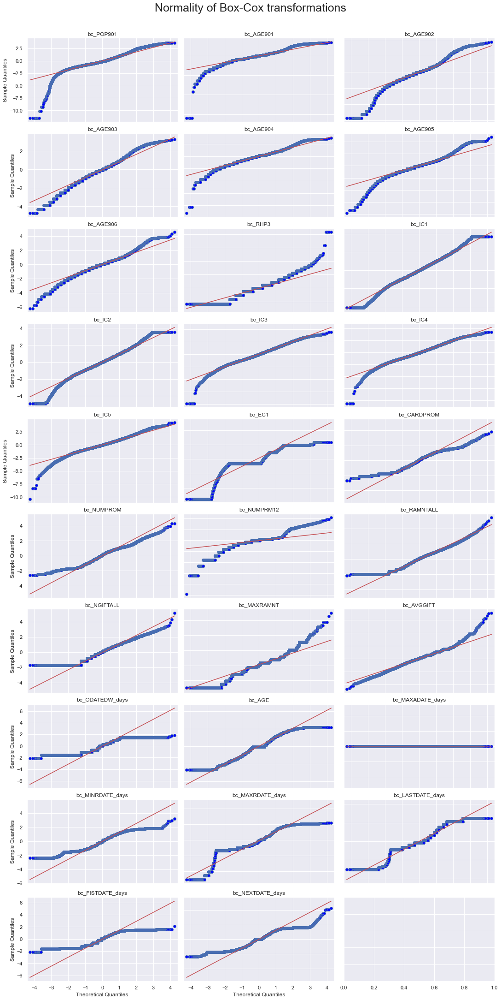

In [105]:
# Plot all Box-Cox transformations
sns.set()
fig, axes = plt.subplots(10,3, constrained_layout=True, figsize=(15,30))

fig.suptitle("Normality of Box-Cox transformations\n", fontsize=25)

for col, ax in zip(bc_vars, axes.flatten()):
    x = trans_df.loc[:,col]
    statsm.qqplot(x, line="q", ax=ax)
    ax.set_title(col)

# Just appear labels on outside axes
for ax in fig.get_axes():
    ax.label_outer()

plt.show()

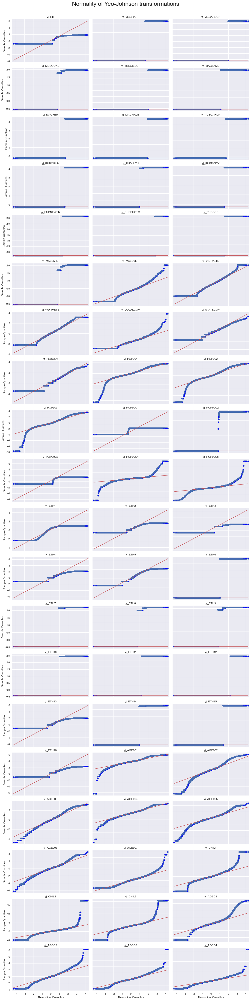

In [96]:
# Plot only a subset (30) Yeo-Johnson transformations (due to computational limitations)
sns.set()
fig, axes = plt.subplots(20,3, constrained_layout=True, figsize=(15,60))

fig.suptitle("Normality of Yeo-Johnson transformations\n", fontsize=25)

for col, ax in zip(yj_vars, axes.flatten()):
    x = trans_df.loc[:,col]
    statsm.qqplot(x, line="q", ax=ax)
    ax.set_title(col)

# Just appear labels on outside axes
for ax in fig.get_axes():
    ax.label_outer()

plt.show()

In [97]:
#Shapiro-Wilk is not as useful for normality testing in large sample sizes as D'Agostino and Pearson's Test, that combines 
#skew and kurtosis to produce an omnibus test of normality for moderate and large sample sizes.

from scipy.stats import normaltest

# D'Agostino and Pearson's Test on the Yeo-Johnson trasformations
for i in yj_vars:
    stat, p = normaltest(trans_df[i])
    print('Statistics=%.3f, p=%.3f' % (stat, p))
    
    # interpretation
    alpha = 0.1
    if p > alpha:
        print('Sample looks Gaussian (fail to reject H0):', i)
    else:
        print('Sample does not look Gaussian (reject H0):', i)

Statistics=635098.824, p=0.000
Sample does not look Gaussian (reject H0): yj_HIT
Statistics=76070.033, p=0.000
Sample does not look Gaussian (reject H0): yj_MBCRAFT
Statistics=106870.818, p=0.000
Sample does not look Gaussian (reject H0): yj_MBGARDEN
Statistics=17032.787, p=0.000
Sample does not look Gaussian (reject H0): yj_MBBOOKS
Statistics=107578.019, p=0.000
Sample does not look Gaussian (reject H0): yj_MBCOLECT
Statistics=35787.684, p=0.000
Sample does not look Gaussian (reject H0): yj_MAGFAML
Statistics=77217.836, p=0.000
Sample does not look Gaussian (reject H0): yj_MAGFEM
Statistics=102646.497, p=0.000
Sample does not look Gaussian (reject H0): yj_MAGMALE
Statistics=82195.440, p=0.000
Sample does not look Gaussian (reject H0): yj_PUBGARDN
Statistics=73801.469, p=0.000
Sample does not look Gaussian (reject H0): yj_PUBCULIN
Statistics=28305.757, p=0.000
Sample does not look Gaussian (reject H0): yj_PUBHLTH
Statistics=66912.630, p=0.000
Sample does not look Gaussian (reject H0): 

Statistics=454.112, p=0.000
Sample does not look Gaussian (reject H0): yj_HHD11
Statistics=305.975, p=0.000
Sample does not look Gaussian (reject H0): yj_HHD12
Statistics=732.170, p=0.000
Sample does not look Gaussian (reject H0): yj_ETHC1
Statistics=2593.668, p=0.000
Sample does not look Gaussian (reject H0): yj_ETHC2
Statistics=1946.888, p=0.000
Sample does not look Gaussian (reject H0): yj_ETHC3
Statistics=920949.088, p=0.000
Sample does not look Gaussian (reject H0): yj_ETHC4
Statistics=273850.385, p=0.000
Sample does not look Gaussian (reject H0): yj_ETHC5
Statistics=18033.803, p=0.000
Sample does not look Gaussian (reject H0): yj_ETHC6
Statistics=850162.589, p=0.000
Sample does not look Gaussian (reject H0): yj_HVP1
Statistics=804955.172, p=0.000
Sample does not look Gaussian (reject H0): yj_HVP2
Statistics=1404543.742, p=0.000
Sample does not look Gaussian (reject H0): yj_HVP3
Statistics=9917244.593, p=0.000
Sample does not look Gaussian (reject H0): yj_HVP4
Statistics=55232.810

Sample does not look Gaussian (reject H0): yj_EIC16
Statistics=2284.841, p=0.000
Sample does not look Gaussian (reject H0): yj_OEDC1
Statistics=224.889, p=0.000
Sample does not look Gaussian (reject H0): yj_OEDC2
Statistics=1519.487, p=0.000
Sample does not look Gaussian (reject H0): yj_OEDC3
Statistics=1210.895, p=0.000
Sample does not look Gaussian (reject H0): yj_OEDC4
Statistics=56.862, p=0.000
Sample does not look Gaussian (reject H0): yj_OEDC5
Statistics=2548.765, p=0.000
Sample does not look Gaussian (reject H0): yj_OEDC6
Statistics=2182566.174, p=0.000
Sample does not look Gaussian (reject H0): yj_OEDC7
Statistics=5382.950, p=0.000
Sample does not look Gaussian (reject H0): yj_EC1
Statistics=1648.379, p=0.000
Sample does not look Gaussian (reject H0): yj_EC2
Statistics=366.642, p=0.000
Sample does not look Gaussian (reject H0): yj_EC3
Statistics=29.795, p=0.000
Sample does not look Gaussian (reject H0): yj_EC4
Statistics=930.362, p=0.000
Sample does not look Gaussian (reject H0

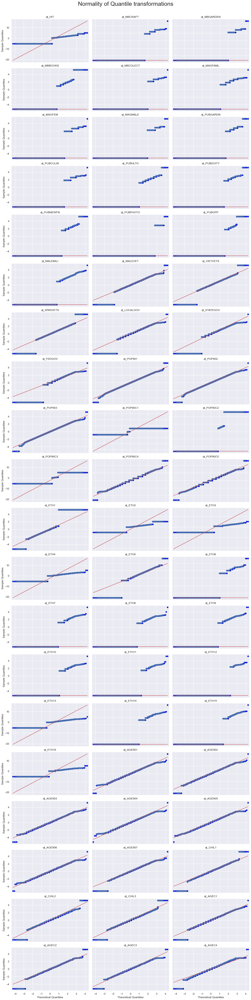

In [98]:
# Plot only a subset (30) Quantile transformations (due to computational limitations)
sns.set()
fig, axes = plt.subplots(20,3, constrained_layout=True, figsize=(15,60))

fig.suptitle("Normality of Quantile transformations\n", fontsize=25)

for col, ax in zip(qt_vars, axes.flatten()):
    x = trans_df.loc[:,col]
    statsm.qqplot(x, line="q", ax=ax)
    ax.set_title(col)

# Just appear labels on outside axes
for ax in fig.get_axes():
    ax.label_outer()

plt.show()

In [99]:
# D'Agostino and Pearson's Test on the Quantile trasformations
for i in qt_vars:
    stat, p = normaltest(trans_df[i])
    print('Statistics=%.3f, p=%.3f' % (stat, p))
    
    # interpretation
    alpha = 0.1
    if p > alpha:
        print('Sample looks Gaussian (fail to reject H0):', i)
    else:
        print('Sample does not look Gaussian (reject H0):', i)

Statistics=376231.285, p=0.000
Sample does not look Gaussian (reject H0): qt_HIT
Statistics=76332.408, p=0.000
Sample does not look Gaussian (reject H0): qt_MBCRAFT
Statistics=107003.322, p=0.000
Sample does not look Gaussian (reject H0): qt_MBGARDEN
Statistics=17568.655, p=0.000
Sample does not look Gaussian (reject H0): qt_MBBOOKS
Statistics=107721.195, p=0.000
Sample does not look Gaussian (reject H0): qt_MBCOLECT
Statistics=36324.455, p=0.000
Sample does not look Gaussian (reject H0): qt_MAGFAML
Statistics=77415.717, p=0.000
Sample does not look Gaussian (reject H0): qt_MAGFEM
Statistics=102806.924, p=0.000
Sample does not look Gaussian (reject H0): qt_MAGMALE
Statistics=82542.158, p=0.000
Sample does not look Gaussian (reject H0): qt_PUBGARDN
Statistics=74069.981, p=0.000
Sample does not look Gaussian (reject H0): qt_PUBCULIN
Statistics=28986.583, p=0.000
Sample does not look Gaussian (reject H0): qt_PUBHLTH
Statistics=67339.182, p=0.000
Sample does not look Gaussian (reject H0): 

Statistics=10367.306, p=0.000
Sample does not look Gaussian (reject H0): qt_HHD4
Statistics=761.461, p=0.000
Sample does not look Gaussian (reject H0): qt_HHD5
Statistics=325.678, p=0.000
Sample does not look Gaussian (reject H0): qt_HHD6
Statistics=16361.407, p=0.000
Sample does not look Gaussian (reject H0): qt_HHD7
Statistics=31743.821, p=0.000
Sample does not look Gaussian (reject H0): qt_HHD8
Statistics=21239.459, p=0.000
Sample does not look Gaussian (reject H0): qt_HHD9
Statistics=454.442, p=0.000
Sample does not look Gaussian (reject H0): qt_HHD10
Statistics=1668.692, p=0.000
Sample does not look Gaussian (reject H0): qt_HHD11
Statistics=17993.564, p=0.000
Sample does not look Gaussian (reject H0): qt_HHD12
Statistics=26769.433, p=0.000
Sample does not look Gaussian (reject H0): qt_ETHC1
Statistics=8953.491, p=0.000
Sample does not look Gaussian (reject H0): qt_ETHC2
Statistics=17513.708, p=0.000
Sample does not look Gaussian (reject H0): qt_ETHC3
Statistics=365306.783, p=0.000

Statistics=27513.957, p=0.000
Sample does not look Gaussian (reject H0): qt_OCC10
Statistics=29507.659, p=0.000
Sample does not look Gaussian (reject H0): qt_OCC11
Statistics=25549.925, p=0.000
Sample does not look Gaussian (reject H0): qt_OCC12
Statistics=26208.276, p=0.000
Sample does not look Gaussian (reject H0): qt_OCC13
Statistics=1631646.616, p=0.000
Sample does not look Gaussian (reject H0): qt_EIC1
Statistics=17068.641, p=0.000
Sample does not look Gaussian (reject H0): qt_EIC2
Statistics=35306.709, p=0.000
Sample does not look Gaussian (reject H0): qt_EIC3
Statistics=21593.402, p=0.000
Sample does not look Gaussian (reject H0): qt_EIC4
Statistics=31779.423, p=0.000
Sample does not look Gaussian (reject H0): qt_EIC5
Statistics=19774.524, p=0.000
Sample does not look Gaussian (reject H0): qt_EIC6
Statistics=31989.523, p=0.000
Sample does not look Gaussian (reject H0): qt_EIC7
Statistics=9681.801, p=0.000
Sample does not look Gaussian (reject H0): qt_EIC8
Statistics=35261.393, p

Statistics=12031.029, p=0.000
Sample does not look Gaussian (reject H0): qt_MINRAMNT
Statistics=23329.608, p=0.000
Sample does not look Gaussian (reject H0): qt_MAXRAMNT
Statistics=6772.346, p=0.000
Sample does not look Gaussian (reject H0): qt_LASTGIFT
Statistics=16512.999, p=0.000
Sample does not look Gaussian (reject H0): qt_TIMELAG
Statistics=28.571, p=0.000
Sample does not look Gaussian (reject H0): qt_AVGGIFT
Statistics=5653.200, p=0.000
Sample does not look Gaussian (reject H0): qt_ODATEDW_days
Statistics=7241.647, p=0.000
Sample does not look Gaussian (reject H0): qt_AGE
Statistics=181691.780, p=0.000
Sample does not look Gaussian (reject H0): qt_MAXADATE_days
Statistics=2778.894, p=0.000
Sample does not look Gaussian (reject H0): qt_MINRDATE_days
Statistics=255.639, p=0.000
Sample does not look Gaussian (reject H0): qt_MAXRDATE_days
Statistics=11517.787, p=0.000
Sample does not look Gaussian (reject H0): qt_LASTDATE_days
Statistics=41.347, p=0.000
Sample does not look Gaussian

In [100]:
#Conclusions on this:
#After checking all the QQ plots for the Box Cox transformations, we conclude that some variables [say some!] are not
#normally distributed, because if both sets of quantiles came from the Normal distribution on all variables, we should 
#see the points forming a line that’s roughly straight.
#Due to computational limitations, we could not Run all the plots for the Yeo-Johson and Quantile transformations, so we 
#Ran only a subset of them (first 30) and we could already spot many variables that were very far from a normal 
#distribution [say some as an example!]. To try to overcome this computational limitation we used the D'Agostino and 
#Pearson's Test, which tests whether a sample differs from a normal distribution (and this one is better on large sample
#sizes!). We concluded that it is very likely these Yeo-Johson and Quantile transformations do not follow a normal 
#distribution, for the most part.

#So, having so many variable transformations that are not gaussian-like distributions, we decided to just check the results
#of two parametric tests for outlier detection on the Yeo-Johson and Quantile transformations, although it is likely 
#these will not provide good solutions due to the issues described previously.

### 6.1. Univariate Outliers

In [81]:
def out_std(data, nstd=3.0, return_thresholds=False):
#nstd - number of standard deviations from the mean to consider an outlier
#return_thresholds - True returns the lower and upper bounds, good for plotting; False returns the masked array 
    
    data_mean, data_std = data.mean(), data.std()
    cut_off = data_std * nstd
    lower, upper = data_mean - cut_off, data_mean + cut_off
    
    if return_thresholds:
        return lower, upper
    
    else:
        #return a boolean mask of outliers for a series using standard deviation
        return data.apply(lambda x: np.any((x<lower) | (x>upper)), 1)

def out_iqr(data, k=1.5, return_thresholds=False):
#some cutoff to multiply by the iqr
#return_thresholds - True returns the lower and upper bounds, good for plotting; False returns the masked array 

    # calculate interquartile range
    q25, q75 = np.percentile(data, 25, axis=0), np.percentile(data, 75, axis=0)
    iqr = q75 - q25
    
    # calculate the outlier cutoff
    cut_off = iqr * k
    lower, upper = q25 - cut_off, q75 + cut_off
    
    if return_thresholds:
        return lower, upper
    
    else: # identify outliers
        #return a boolean mask of outliers for a series using interquartile range
        return data.apply(lambda x: np.any((x<lower) | (x>upper)), 1)

In [82]:
outlier_labels = pd.concat([out_std(trans_df[yj_vars], 6.5), out_std(trans_df[qt_vars], 6.5), out_iqr(trans_df[yj_vars], 6), out_iqr(trans_df[qt_vars], 6)], axis=1)

#True = classified as outlier, False otherwise
outlier_labels.columns = ["outyjstd","outqtstd","outyjiqr","outqtiqr"]

In [83]:
print('\033[1mPercentage of outliers, first with the Standard Deviation Method\033[0m')
print('outyjstd:', round(outlier_labels['outyjstd'].value_counts()[1]/outlier_labels.shape[0]*100,3), '%')
print(outlier_labels['outyjstd'].value_counts(), '\n')

print('outqtstd:', round(outlier_labels['outqtstd'].value_counts()[1]/outlier_labels.shape[0]*100,3), '%')
print(outlier_labels['outqtstd'].value_counts(), '\n')

print('\033[1mWith the Interquartile Range Method\033[0m')
print('outyjiqr:', round(outlier_labels['outyjiqr'].value_counts()[1]/outlier_labels.shape[0]*100,3), '%')
print(outlier_labels['outyjiqr'].value_counts(), '\n')

print('outqtiqr:', round(outlier_labels['outqtiqr'].value_counts()[1]/outlier_labels.shape[0]*100,3), '%')
print(outlier_labels['outqtiqr'].value_counts())

Percentage of outliers, first with the Standard Deviation Method
outyjstd: 3.067 %
False    91711
True      2902
Name: outyjstd, dtype: int64 

outqtstd: 2.842 %
False    91924
True      2689
Name: outqtstd, dtype: int64 

With the Interquartile Range Method
outyjiqr: 96.951 %
True     91728
False     2885
Name: outyjiqr, dtype: int64 

outqtiqr: 96.903 %
True     91683
False     2930
Name: outqtiqr, dtype: int64


In [ ]:
#The IQR method considers the majority of the dataset as an outlier because some variables have a very narrow range between
#the max and min value, which makes it very likely for a record to be below the lower fence or above the upper fence on 
#one of those variables.

In [ ]:
#para as yj_vars

In [148]:
variables_yj=((trans_df[yj_vars].max() - trans_df[yj_vars].min()) > 8)

variables_yj=variables_yj[variables_yj==True].index

In [149]:
len(variables_yj)

113

In [150]:
outyjiqr_new=out_iqr(trans_df[yj_vars][variables_yj], 6)

In [151]:
outyjiqr_new.value_counts()

False    91570
True      3043
dtype: int64

In [152]:
(outlier_labels["outyjstd"] & outyjiqr_new).value_counts()

False    91881
True      2732
dtype: int64

In [ ]:
#para as qt_vars

In [ ]:
#The ranges on the quantile dataframe are always the same (10.398675) so we cant apply what was done previosuly...
#So I will use the same variables as before, just this time for 

In [144]:
trans_df[qt_vars].max() - trans_df[qt_vars].min()

qt_HIT              10.398675
qt_MBCRAFT          10.398675
qt_MBGARDEN         10.398675
qt_MBBOOKS          10.398675
qt_MBCOLECT         10.398675
qt_MAGFAML          10.398675
qt_MAGFEM           10.398675
qt_MAGMALE          10.398675
qt_PUBGARDN         10.398675
qt_PUBCULIN         10.398675
qt_PUBHLTH          10.398675
qt_PUBDOITY         10.398675
qt_PUBNEWFN         10.398675
qt_PUBPHOTO         10.398675
qt_PUBOPP           10.398675
qt_MALEMILI         10.398675
qt_MALEVET          10.398675
qt_VIETVETS         10.398675
qt_WWIIVETS         10.398675
qt_LOCALGOV         10.398675
qt_STATEGOV         10.398675
qt_FEDGOV           10.398675
qt_POP901           10.398675
qt_POP902           10.398675
qt_POP903           10.398675
qt_POP90C1          10.398675
qt_POP90C2          10.398675
qt_POP90C3          10.398675
qt_POP90C4          10.398675
qt_POP90C5          10.398675
qt_ETH1             10.398675
qt_ETH2             10.398675
qt_ETH3             10.398675
qt_ETH4   

In [154]:
variables_qt=[]

for i in range(len(variables_yj)):
    variables_qt.append(variables_yj[i].replace('yj_', 'qt_'))

In [156]:
len(variables_qt)

113

In [157]:
outqtiqr_new=out_iqr(trans_df[qt_vars][variables_qt], 6)

In [158]:
outqtiqr_new.value_counts()

False    92734
True      1879
dtype: int64

In [161]:
(outlier_labels["outqtstd"] & outqtiqr_new).value_counts()

False    92734
True      1879
dtype: int64

In [ ]:
#All the records considered outliers here are also considered as outliers by outlier_labels["outqtstd"]! That is good.

In [ ]:
#Although these results are much more reasonable, we will not use the outlier detections with the IQR method. Still, these
#results seem to be in line with the outlier detections provided by the std. deviation method, which is a good sign.

In [ ]:
#Conclusions on this:
#The IQR method gives very strange results: even with a k higher than the "default", we get almost 100% of the records 
#considered as outliers. These results are very poor, as expected, so we will not use this method on this data (right?).

#On the other hand, the Std. Deviation method gives more believable results: on the Yeo-Johnson transformations, it
#classifies 3.001% of the records as outliers with a number of std. deviations of 6.5 (altough this is, still, a very
#high value).

### 6.2. Outlier removal - manually filtering by checking the boxplots

In [ ]:
(data.loc[:, 'POP901':'AC2']).describe(include='all').T

### 6.3. Outlier removal - non-parametric method(s)

The Local Outlier Factor (LOF) method would be a good approach, but it becomes less reliable with an increased number of features, referred to as the curse of dimensionality (https://machinelearningmastery.com/model-based-outlier-detection-and-removal-in-python/). <br>
**AFINAL O DAVID DISSE QUE PODEMOS USAR LOF!**

**Isolation Forest:**

https://www.kdnuggets.com/2018/12/four-techniques-outlier-detection.html <br>
https://quantdare.com/isolation-forest-algorithm/ <br>
https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.IsolationForest.html <br>
https://machinelearningmastery.com/model-based-outlier-detection-and-removal-in-python/ <br>

In [106]:
import sklearn.preprocessing as prep

In [107]:
#std_metric = prep.MinMaxScaler().fit_transform(metric_vars)

In [108]:
#std_metric = pd.DataFrame(std_metric, columns = metric_vars.columns, index = metric_vars.index)

In [109]:
from sklearn.ensemble import IsolationForest

clf = IsolationForest(random_state=42)
#table = pd.concat([metric_vars], axis=1)
clf.fit(metric_vars)
outiftable = pd.DataFrame(clf.predict(metric_vars), index = metric_vars.index)

In [111]:
outif = outiftable.apply(lambda x: np.any(x == -1), 1)
metric_vars[~outif].head()

,HIT,MBCRAFT,MBGARDEN,MBBOOKS,MBCOLECT,MAGFAML,MAGFEM,MAGMALE,PUBGARDN,PUBCULIN,PUBHLTH,PUBDOITY,PUBNEWFN,PUBPHOTO,PUBOPP,MALEMILI,MALEVET,VIETVETS,WWIIVETS,LOCALGOV,STATEGOV,FEDGOV,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,ETH3,ETH4,ETH5,ETH6,ETH7,ETH8,ETH9,ETH10,ETH11,ETH12,ETH13,ETH14,ETH15,ETH16,AGE901,AGE902,AGE903,AGE904,AGE905,AGE906,AGE907,CHIL1,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,AGEC6,AGEC7,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHAGE1,HHAGE2,HHAGE3,HHN1,HHN2,HHN3,HHN4,HHN5,HHN6,MARR1,MARR2,MARR3,MARR4,HHP1,HHP2,DW1,DW2,DW3,DW4,DW5,DW6,DW7,DW8,DW9,HV1,HV2,HV3,HV4,HU1,HU2,HU3,HU4,HU5,HHD1,HHD2,HHD3,HHD4,HHD5,HHD6,HHD7,HHD8,HHD9,HHD10,HHD11,HHD12,ETHC1,ETHC2,ETHC3,ETHC4,ETHC5,ETHC6,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6,HUR1,HUR2,RHP1,RHP2,RHP3,RHP4,HUPA1,HUPA2,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP1,RP2,RP3,RP4,IC1,IC2,IC3,IC4,IC5,IC6,IC7,IC8,IC9,IC10,IC11,IC12,IC13,IC14,IC15,IC16,IC17,IC18,IC19,IC20,IC21,IC22,IC23,HHAS1,HHAS2,HHAS3,HHAS4,MC1,MC2,MC3,TPE1,TPE2,TPE3,TPE4,TPE5,TPE6,TPE7,TPE8,TPE9,PEC1,PEC2,TPE10,TPE11,TPE12,TPE13,LFC1,LFC2,LFC3,LFC4,LFC5,LFC6,LFC7,LFC8,LFC9,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC9,OCC10,OCC11,OCC12,OCC13,EIC1,EIC2,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,OEDC7,EC1,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC1,AFC2,AFC3,AFC4,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC1,POBC2,LSC1,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC2,HC3,HC4,HC5,HC6,HC7,HC8,HC9,HC10,HC11,HC12,HC13,HC14,HC15,HC16,HC17,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,CARDPROM,NUMPROM,CARDPM12,NUMPRM12,RAMNTALL,NGIFTALL,CARDGIFT,MINRAMNT,MAXRAMNT,LASTGIFT,TIMELAG,AVGGIFT,ODATEDW_days,AGE,MAXADATE_days,MINRDATE_days,MAXRDATE_days,LASTDATE_days,FISTDATE_days,NEXTDATE_days
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,39,34,18,10,2,1,992,264,332,0,35,65,47,53,92,1,0,0,11,0,0,0,0,0,0,0,11,0,0,0,39,48,51,40,50,54,25,31,42,27,11,14,18,17,13,11,15,12,11,34,25,18,26,10,23,18,33,49,28,12,4,61,7,12,19,1.98,2.76,97,95,2,2,0,0,7,7,0,479,635,3,2,86,14,96,4,7,38,80,70,32,84,16,6,2,5,9,15,3,17,50,25,0,0,0,2,7,13,27,47,0,1,61,5.8,6.1,1.5,0.4,2,0,0,14,1,0,0,2,5,17,73,307.0,318.0,349.0,378.0,12883.0,13,23,23,23,15,1,0,0,1,4,25,24,26,17,2,0,0,2,28,4,51,1,46,54,3,88,8,0,0,0,0,0,0,4,1,13,14,16,2,45,56,64,50,64,44,62,53,99,0,0,9,3,8,13,9,0,3,9,3,15,19,5,4,3,0,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,0,12.0,16,10,39,21,8,4,3,5,20,3,19,4,0,0,0,18,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,3,74,88,8,0,4,96,77,19,13,31,5,14,14,31,54,46,0,0,90,0,10,0,0,0,33,65,40,99,99,600,200,10,7,27,74,6,14,240.0,31,14,5.0,12.0,10.0,4.0,7.741935,4017,62.0,1064,2709,2160,1492,3713.0,3593.0
148535,16,0.0,0.0,3.0,1.0,1.0,1.0,0.0,0.0,0.0,2.0,0.0,3.0,0.0,0.0,0,15,55,11,6,2,1,3611,940,998,99,0,0,50,50,67,0,0,31,6,4,2,6,4,14,0,0,2,0,1,4,34,41,43,32,42,45,32,33,46,21,13,14,33,23,10,4,2,11,16,36,22,15,12,1,5,4,21,75,55,23,9,69,4,3,24,3.17,3.60,99,99,0,0,0,0,0,0,0,5468,5218,12,10,96,4,97,3,9,59,94,88,55,95,5,4,1,3,5,4,2,18,44,5,0,0,0,97,98,98,98,99,94,0,83,7.6,7.3,2.1,0.5,0,0,0,4,0,0,0,91,91,91,94,1088.0,1096.0,1026.0,1037.0,36175.0,2,6,2,5,15,14,13,10,33,2,5,2,5,15,14,14,10,32,6,2,66,3,56,44,9,80,14,0,0,0,0,0,0,6,0,2,24,32,12,71,70,83,58,81,57,64,57,99,99,0,22,24,4,21,13,2,1,6,0,4,1,0,3,1,0,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,2,16.0,5,5,12,21,7,30,20,14,24,4,24,10,0,0,0,8,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,42,39,50,7,27,16,99,92,53,5,10,2,26,56,97,99,0,0,0,96,0,4,0,0,0,99,0,99,99,99,2000,400,6,5,12,32,6,13,47.0,3,1,10.0,25.0,25.0,1

**DBSCAN:**

https://medium.com/learningdatascience/anomaly-detection-techniques-in-python-50f650c75aaf

In [73]:
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN

In [ ]:
# # K-distance graph to find out the right eps value
# neigh = NearestNeighbors(n_neighbors=20)
# neigh.fit(std_metric)
# distances, _ = neigh.kneighbors(std_metric)
# distances = np.sort(distances[:, -1])
# plt.plot(distances)
# plt.show()

In [ ]:
outlier_detection = DBSCAN(
 eps = 2, 
 metric='euclidean', 
 min_samples = 50,
 n_jobs = -1)

clusters = outlier_detection.fit_predict(std_metric)

In [128]:
from collections import Counter

In [129]:
Counter(clusters)

Counter({-1: 94608, 0: 5})

## 7. Missing Values

### 7.1. Imputation for metric variables (KNN)

### 7.1. Imputation for non-metric variables (DataWig and mode imputation)

## 8. Feature Engineering

## 9. Data Cleaning Validation

Check boxplots, histograms and correlations, again, after the Data Cleaning phase is finished. Data Cleaning included Coherence Checking, Outliers, Missing Values and Feature Engineering.

## 10. Feature Selection

DON'T FORGET <br>
Separate between Lapsed & minus than 390 days since the last donation (1), and the donors with more than 720 days since the last donation (2). <br>
Then, do the same perspectives for each group.